# Easigenomics, NK cell clustering

- In this notebook only NK cells are selected for analysis
- NK cell cluster was defined in notebook: Easi_subset_clustering.ipynb 
- Cluster was defined from RNA map, cluster 9 represents NK cells (leiden resolution = 1) 
- Clustering of NK cells is accomplished using latent space coordinates,

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scanpy as sc
import umap
from pySankey import sankey

import warnings

warnings.filterwarnings('ignore')

/research/users/tiinajt/miniconda3/envs/tiina-env2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    
    return fig

In [3]:
#Retrieve the object

adata = ad.read_h5ad('/research/groups/sysgen/PROJECTS/scHEMAP/tiina_work/Easigenomics_subset_final.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 58674 × 32738
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1', 'leiden_0.5', 'leiden_1'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'BATCH_colors', 'DIAGNOSIS_colors', 'SAMPLE_CODE_colors', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_TotalVI', 'X_pca', 'X_umap', 'clr_protein_expression', 'dsb_protein_expression', 'protein_expression'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [5]:
#AA, AML and MDS samples are selected for analysis

adata.obs['DIAGNOSIS'].unique().tolist()

['Aplastic anemia', 'AML', 'MDS']

In [6]:
#Samples included to analysis

adata.obs['SAMPLE_CODE'].unique().tolist()

['EG34',
 'EG35',
 'EG36',
 'EG37',
 'EG44',
 'EG45',
 'EG46',
 'EG47',
 'EG48',
 'EG49',
 'EG50',
 'EG51',
 'EG52',
 'EG53',
 'EG54',
 'EG55',
 'EG56',
 'EG57',
 'EG58',
 'EG59',
 'EG60',
 'EG61',
 'EG62',
 'EG63']

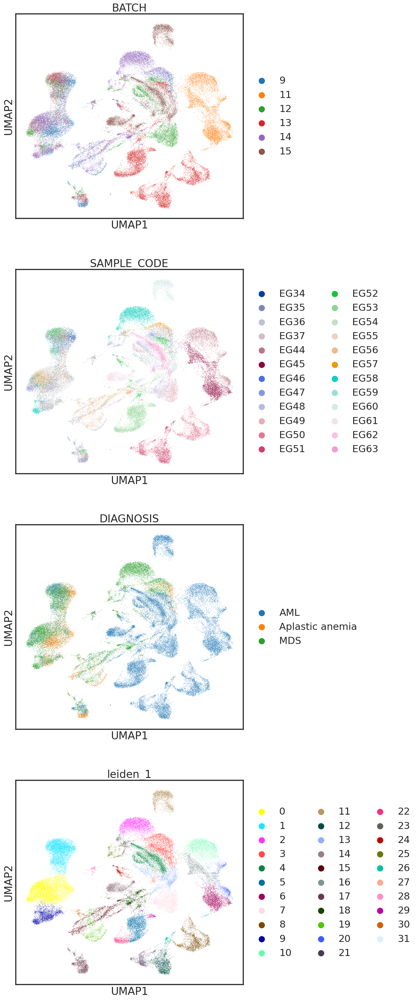

In [7]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(9,9)})

sc.pl.umap(adata, color = ['BATCH', 'SAMPLE_CODE', 'DIAGNOSIS', 'leiden_1'], ncols=1)

In [8]:
adata_nk = adata[(adata.obs['leiden_1'] == "9")]

In [9]:
#NK cell counts

adata_nk.shape

(2253, 32738)

In [10]:
adata_nk

View of AnnData object with n_obs × n_vars = 2253 × 32738
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1', 'leiden_0.5', 'leiden_1'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'BATCH_colors', 'DIAGNOSIS_colors', 'SAMPLE_CODE_colors', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_TotalVI', 'X_pca', 'X_umap', 'clr_protein_expression', 'dsb_protein_expression', 'protein_expression'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distan

In [11]:
adata_latent = adata_nk.copy()


# NK cell clustering

- Clustering is performed based on latent space coordinates

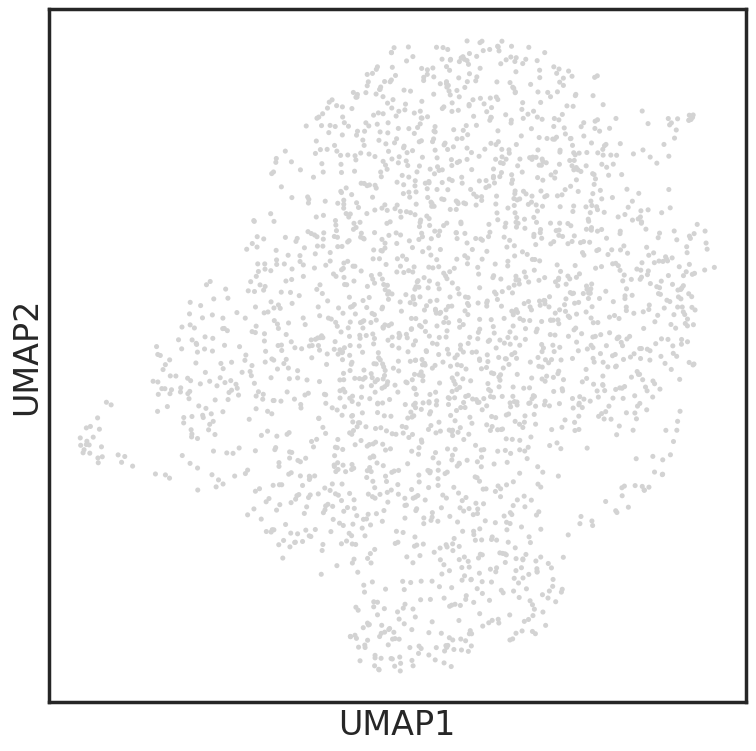

In [12]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_latent, use_rep = 'X_TotalVI')    

sc.tl.umap(adata_latent)

sc.pl.umap(adata_latent)

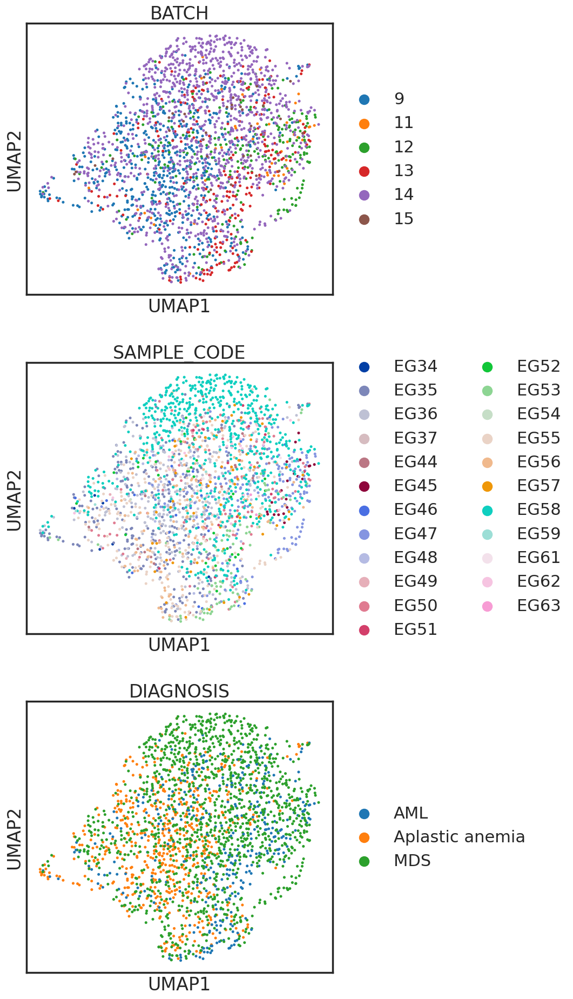

In [13]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(7,7)})

sc.pl.umap(adata_latent, color = ['BATCH', 'SAMPLE_CODE', 'DIAGNOSIS'], ncols = 1)

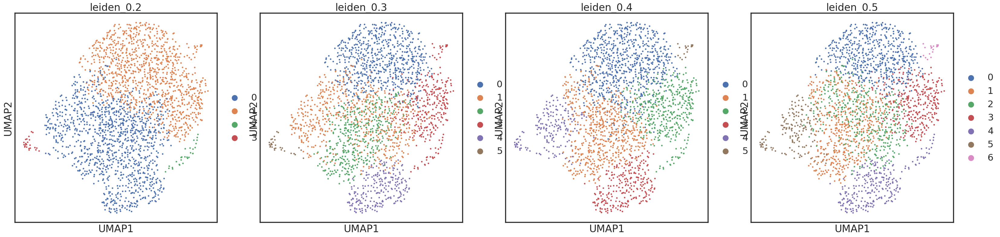

In [14]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(9,9)})

sc.tl.leiden(adata_latent, resolution = 0.2, key_added = "leiden_0.2")
sc.tl.leiden(adata_latent, resolution = 0.3, key_added = "leiden_0.3")
sc.tl.leiden(adata_latent, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata_latent, resolution = 0.5, key_added = "leiden_0.5")

sc.pl.umap(adata_latent, color=['leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5'], ncols =4)


In [15]:
#Removing mitochondrial and ribosomal genes

#genes to be removed
mito_genes = adata_latent.var_names.str.startswith('MT-')
ribo_genes = adata_latent.var_names.str.startswith('RPL')
ribo_genes1 = adata_latent.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

adata_latent = adata_latent[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

### Marker genes 

In [16]:
adata_latent.uns['log1p']["base"] = None 

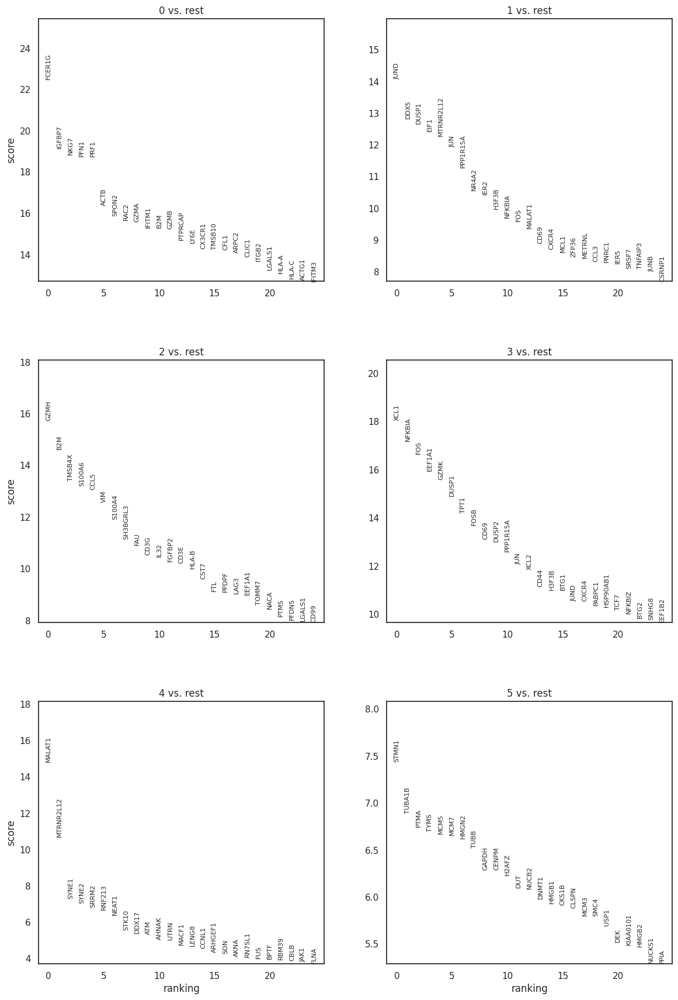

In [17]:
sns.set(style='white',  context='notebook', rc={'figure.figsize':(7,7)})


#Based on latent

sc.tl.rank_genes_groups(adata_latent, 'leiden_0.4', method='wilcoxon')
sc.pl.rank_genes_groups(adata_latent, n_genes=25, sharey=False, ncols=2)

### Yang scores

In [18]:
cd56bright= ['IL7R', 'SELL', 'KLRC1', 'GZMK', 'CD44', 'XCL1', 'XCL2']

active = ['NFKBIA', 'JUN', 'JUNB', 'ZFP36', 'DOS', 'FOSB', 'DUSP1', 'NR4A2', 'CXCR4']

terminal = ['ZEB2','HAVCR2','WDR74', 'TMEM107', 'C12orf57', 'HIST1H1E', 'HIST1H1C', 'HIST1H1D', 'HIST2H2BE', 'JUN', 'PTCH2', 'CXCR1', 'RNU12', 'RNU11', 'CD38']

mature= ['B3GAT1', 'PRF1', 'GZMA', 'GZMB', 'GZMH', 'ACTB', 'ARPC2', 'CORO1A', 'CFL1', 'CST7', 'PFN1', 'ANXA1']

adaptive = ['KLRC2', 'CD3E', 'CD3D', 'CD3G', 'IL32', 'CD52']

inflamed = ['IFIT3', 'IFIT2', 'TNF', 'CD69']


In [19]:
sc.tl.score_genes(adata_latent, gene_list=cd56bright, score_name= "CD56bright_score_yang")

In [20]:
adata_latent

AnnData object with n_obs × n_vars = 2253 × 32619
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1', 'leiden_0.5', 'leiden_1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'CD56bright_score_yang'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'BATCH_colors', 'DIAGNOSIS_colors', 'SAMPLE_CODE_colors', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'leiden_0.2_colors', 'leiden_0.3_colors', 'leiden_0.4_colors'
    obsm: 'X_TotalVI', 'X_pca', 'X_umap', 'clr_protein_expression

In [21]:
sc.tl.score_genes(adata_latent, gene_list=active, score_name= "active_score_yang")
sc.tl.score_genes(adata_latent, gene_list=terminal, score_name= "terminal_score_yang")
sc.tl.score_genes(adata_latent, gene_list=mature, score_name= "mature_score_yang")
sc.tl.score_genes(adata_latent, gene_list=adaptive, score_name= "adaptive_score_yang")
sc.tl.score_genes(adata_latent, gene_list=inflamed, score_name= "inflamed_score_yang")
sc.tl.score_genes(adata_latent, gene_list=cd56bright, score_name= "CD56bright_score_yang")

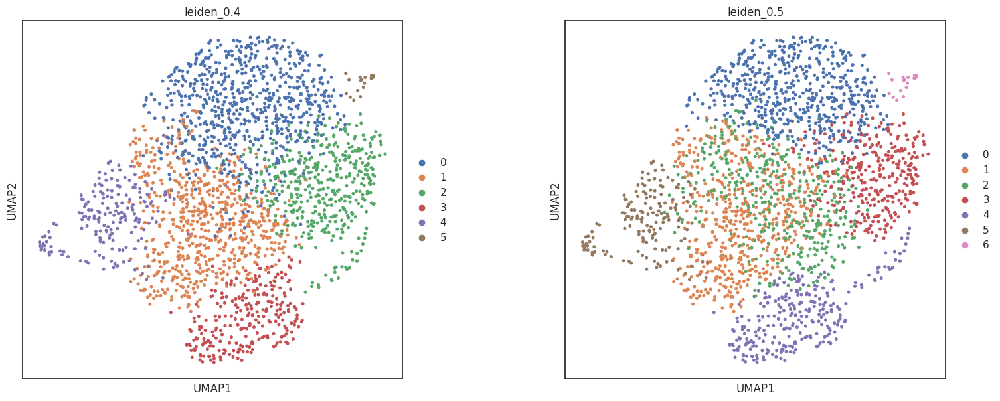

In [22]:
sc.pl.umap(adata_latent, color=['leiden_0.4', 'leiden_0.5'],wspace =0.3, ncols =2)

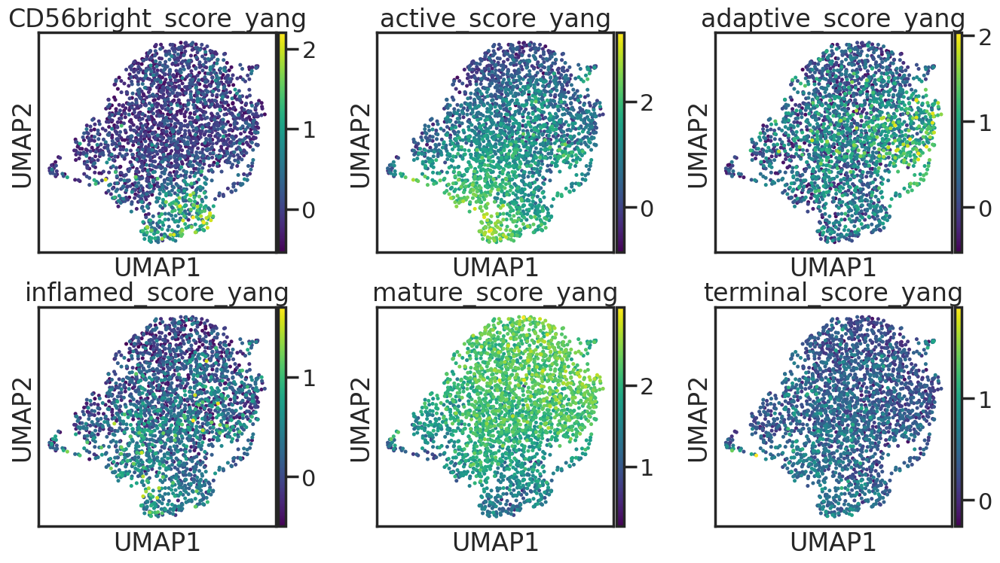

In [23]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(4,4)})

sc.pl.umap(adata_latent,ncols=3, cmap = "viridis", wspace =0.3,  color=np.sort(adata_latent.obs.columns[adata_latent.obs.columns.str.endswith('_score_yang')]))

### Melsen scores

In [24]:
proliferative_melsen = ['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']

precursor_melsen = ['CD34', 'KIT']

ILC_melsen = ['IL7R', 'KIT', 'FGFBP2', 'PRSS23']

tissue_resident_melsen = ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']

cd56bright_melsen = 'SELL', 'CD2', 'IL7R', 'KLRC1', 'NCAM1'

mature_gzmk_neg_melsen = ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1']

mature_gzmk_pos_melsen = ['GZMK', 'SELL'] #these markers higher compared to gzmk neg population

cd56dim_reduced_effector_melsen = ['NKG7', 'FCGR3A']


In [25]:
sc.tl.score_genes(adata_latent, gene_list=proliferative_melsen, score_name= "proliferative_score_melsen") 
sc.tl.score_genes(adata_latent, gene_list=precursor_melsen, score_name= "precursor_score_melsen") 
sc.tl.score_genes(adata_latent, gene_list=ILC_melsen, score_name= "ilc_score_melsen") 
sc.tl.score_genes(adata_latent, gene_list=tissue_resident_melsen, score_name= "tissue_resident_score_melsen") 
sc.tl.score_genes(adata_latent, gene_list=cd56bright_melsen, score_name= "CD56bright_score_melsen") 
sc.tl.score_genes(adata_latent, gene_list=mature_gzmk_neg_melsen, score_name= "mature/gzmk-_score_melsen") 
sc.tl.score_genes(adata_latent, gene_list=mature_gzmk_pos_melsen, score_name= "mature/gzmk+_score_melsen") 
sc.tl.score_genes(adata_latent, gene_list=cd56dim_reduced_effector_melsen, score_name= "cd56dim_reduced_effector_melsen") 

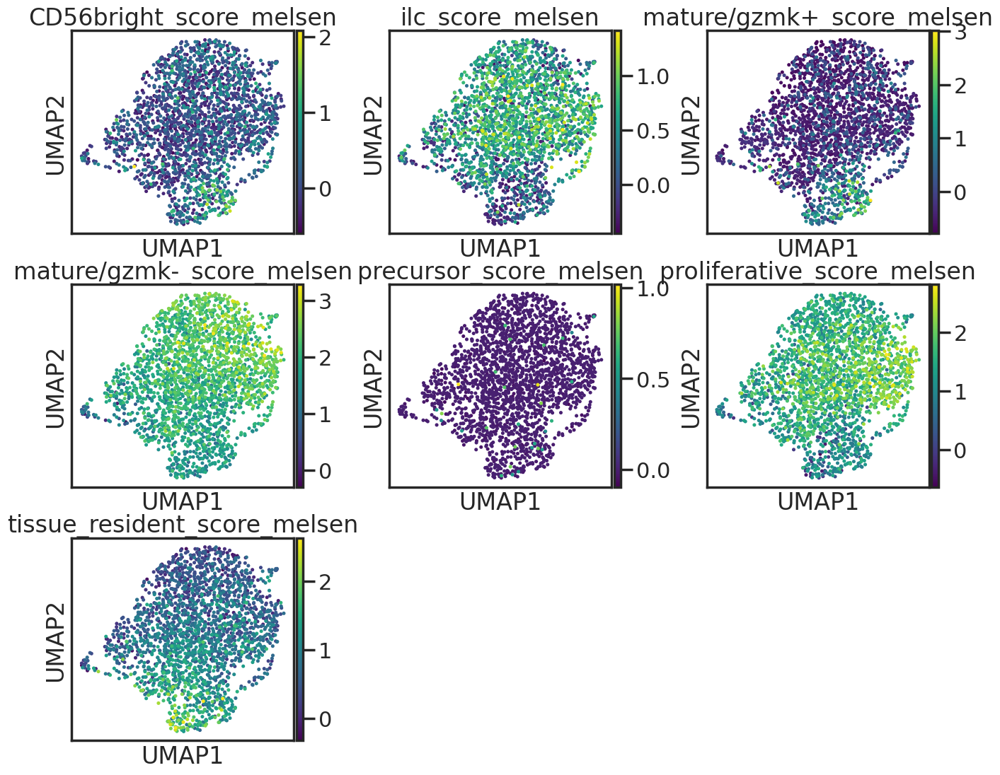

In [26]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(4,4)})

sc.pl.umap(adata_latent, ncols=3, cmap= "viridis", wspace =0.3,  color=np.sort(adata_latent.obs.columns[adata_latent.obs.columns.str.endswith('_score_melsen')]))

RNA


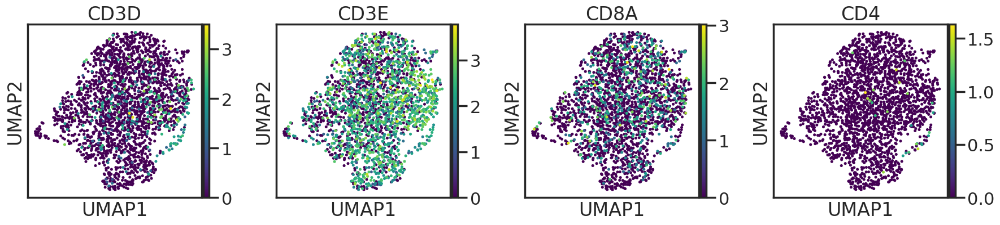

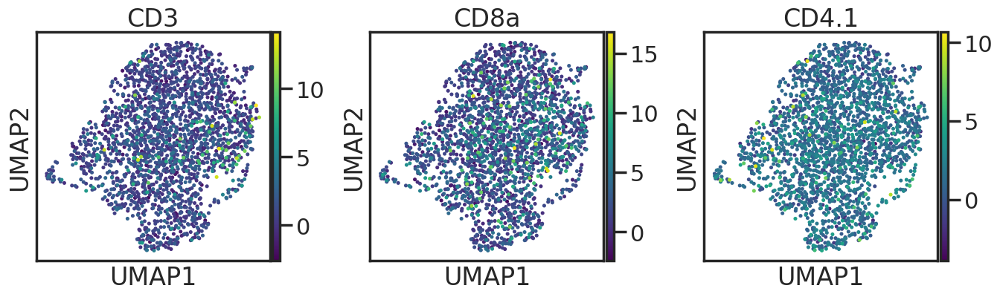

In [27]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(4,4)})

#Check T cell markers

print("RNA")
sc.pl.umap(adata_latent,wspace =0.3, cmap="viridis", color=['CD3D', 'CD3E', 'CD8A', 'CD4'])

#print("Surface protein")
sc.pl.umap(adata_latent, wspace =0.3, cmap="viridis", color=['CD3', 'CD8a', 'CD4.1'])

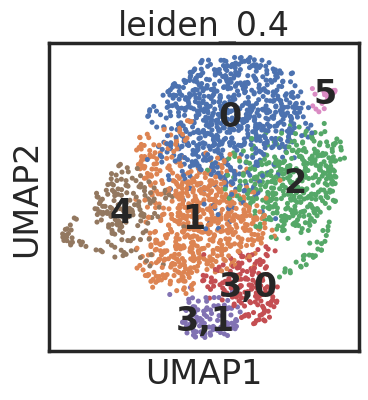

0      731
1      643
2      422
4      179
3,0    157
3,1    102
5       19
Name: leiden_0.4, dtype: int64

In [28]:
#CD56bright subset could include tissue-resident NK cells (based on Melsen tissue-resident scores), so this cluster is further clustered

orig_key = 'leiden_0.4' 
new_key = 'leiden_0.4'
new_rg_key = 'rg_res0.4_sub'
sub_key = '3'

res = 0.2
sc.tl.leiden(adata_latent, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_latent, color=new_key, legend_loc = 'on data')
adata_latent.obs[new_key].value_counts()



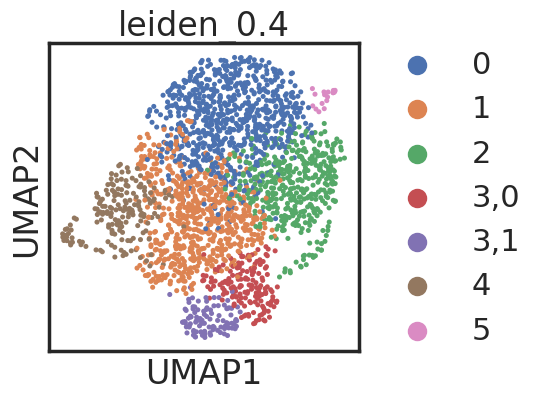

In [29]:
sc.pl.umap(adata_latent, color=['leiden_0.4'])

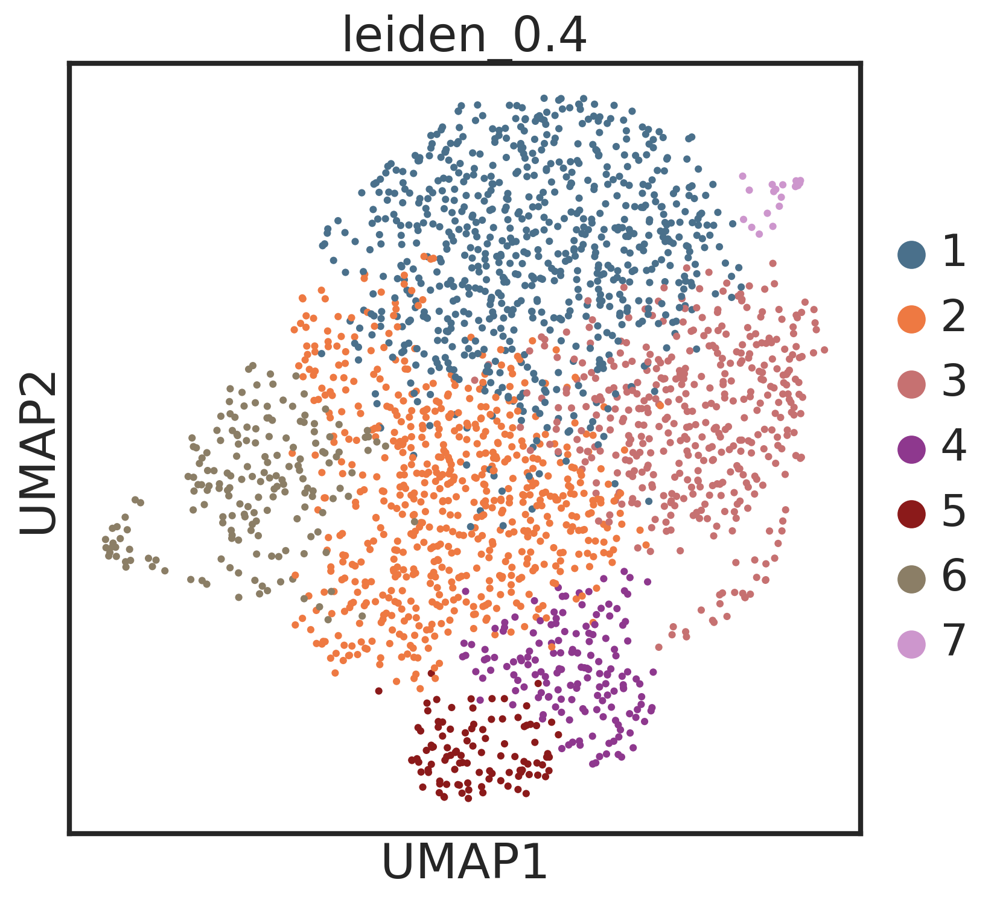

In [66]:
#New numbers for clusters

new_cluster_names = [
    '1', '2',
    '3', '4',
    '5', '6', '7']

adata_latent.rename_categories('leiden_0.4', new_cluster_names)

#Latent

sc.pl.umap(adata_latent, color=['leiden_0.4'])

Omitting rank_genes_groups/names as old categories do not match.
Omitting rank_genes_groups/scores as old categories do not match.
Omitting rank_genes_groups/pvals as old categories do not match.
Omitting rank_genes_groups/pvals_adj as old categories do not match.
Omitting rank_genes_groups/logfoldchanges as old categories do not match.


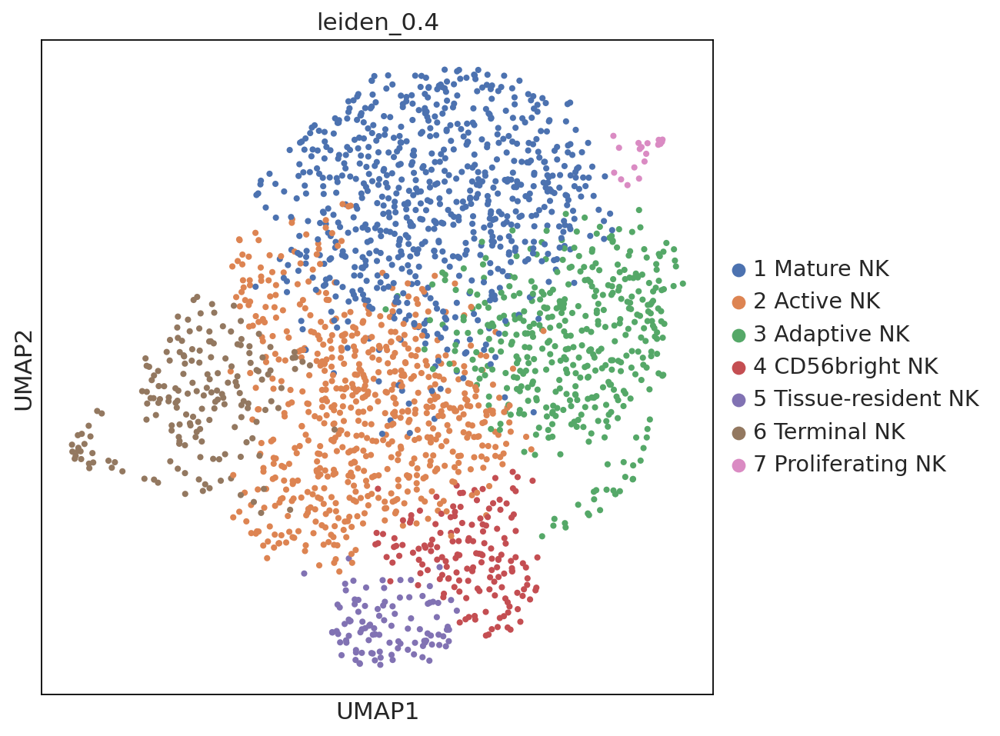

In [31]:
#Renaming clusters

sc.set_figure_params(figsize=(7, 7))
new_cluster_names = [
    '1 Mature NK',
    '2 Active NK', '3 Adaptive NK',
    '4 CD56bright NK', '5 Tissue-resident NK',
    '6 Terminal NK', '7 Proliferating NK']

adata_latent.rename_categories('leiden_0.4', new_cluster_names)

#Latent

sc.pl.umap(adata_latent, color=['leiden_0.4'])

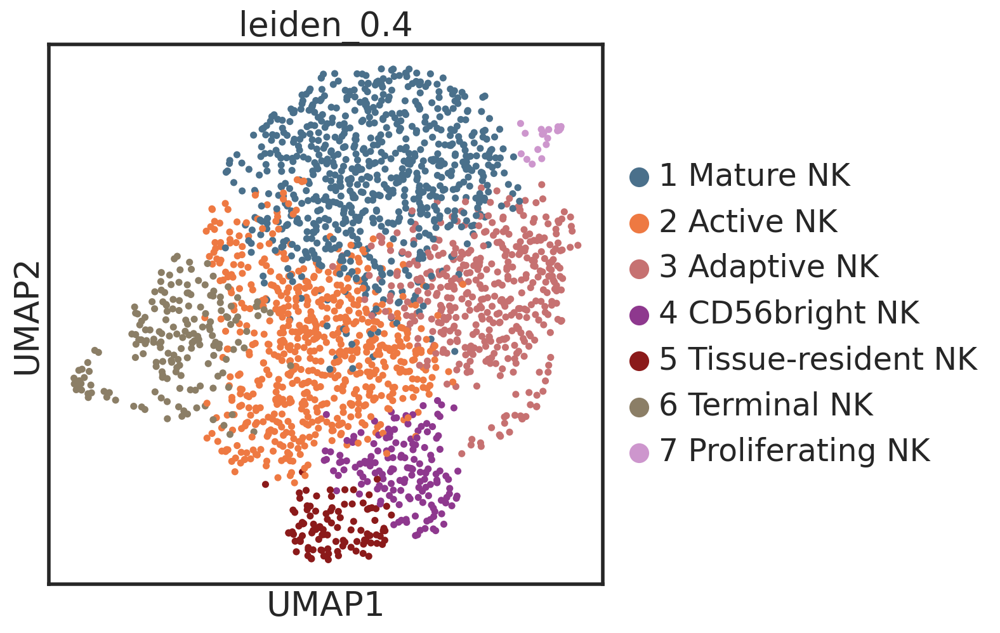

In [32]:
#Defining new cluster colors
sns.set(style='white',  context='poster', rc={'figure.figsize':(7,7)})


#8 clusters
#Immature: #8E388E
#Adaptive: #C67171
#Active: #EE7942
#Mature: #4A708B
#Terminal: #8B7E66
#Proliferating: #CD96CD
# Precursors: #548B54
#Tissue-resident: #8B1A1A


cols = ["#4A708B","#EE7942", "#C67171" ,"#8E388E", "#8B1A1A", "#8B7E66", "#CD96CD"]

adata_latent.uns['leiden_0.4_colors'] = cols

sc.pl.umap(adata_latent, color=['leiden_0.4'], size=100)

In [33]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, fontsize = 25, dpi_save=200, vector_friendly=True)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


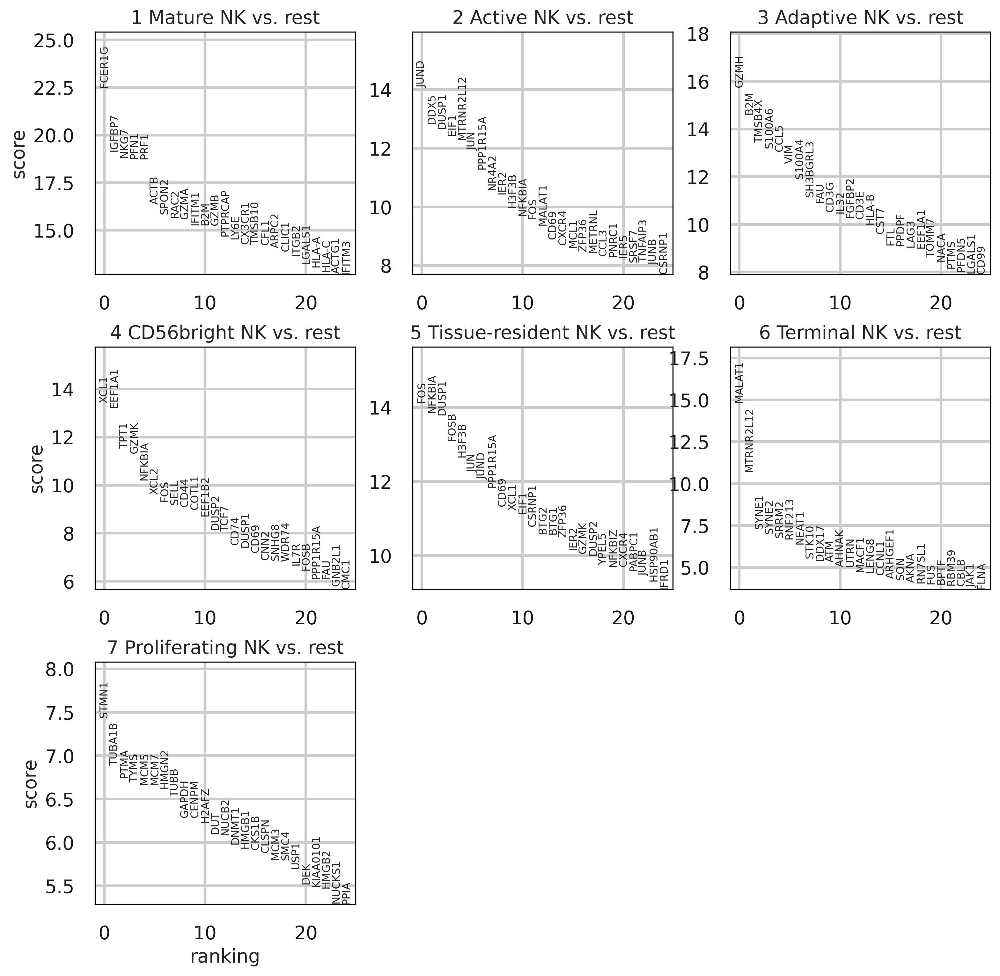

In [34]:
sc.settings.set_figure_params(dpi=150, dpi_save=300, vector_friendly=True)

#Based on latent

sc.tl.rank_genes_groups(adata_latent, 'leiden_0.4', method='wilcoxon')
sc.pl.rank_genes_groups(adata_latent, n_genes=25, sharey=False, ncols=3)

In [35]:
marker_genes = pd.Series()
for i in adata_latent.obs['leiden_0.4'].cat.categories:
    marker_genes = marker_genes.append(sc.get.rank_genes_groups_df(adata_latent, group=i, pval_cutoff=1e-4, log2fc_min=1)['names'][:5])
marker_genes = marker_genes.unique()

In [36]:
marker_genes

array(['FCER1G', 'IGFBP7', 'PRF1', 'SPON2', 'GZMB', 'JUN', 'PPP1R15A',
       'NR4A2', 'NFKBIA', 'CCL3', 'GZMH', 'S100A6', 'CCL5', 'VIM', 'CD3G',
       'XCL1', 'GZMK', 'XCL2', 'FOS', 'DUSP1', 'FOSB', 'H3F3B',
       'MTRNR2L12', 'SYNE1', 'STMN1', 'TUBA1B', 'PTMA', 'TYMS', 'MCM5'],
      dtype=object)

In [37]:
adata_latent

AnnData object with n_obs × n_vars = 2253 × 32619
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1', 'leiden_0.5', 'leiden_1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'CD56bright_score_yang', 'active_score_yang', 'terminal_score_yang', 'mature_score_yang', 'adaptive_score_yang', 'inflamed_score_yang', 'proliferative_score_melsen', 'precursor_score_melsen', 'ilc_score_melsen', 'tissue_resident_score_melsen', 'CD56bright_score_melsen', 'mature/gzmk-_score_melsen', 'mature/gzmk+_score_melsen', 'cd56dim_reduced_effector_melsen'
    var: 'highly_variable', 'means', 'dis

In [38]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=120, fontsize = 18, dpi_save=200, vector_friendly=True)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_0.4']`


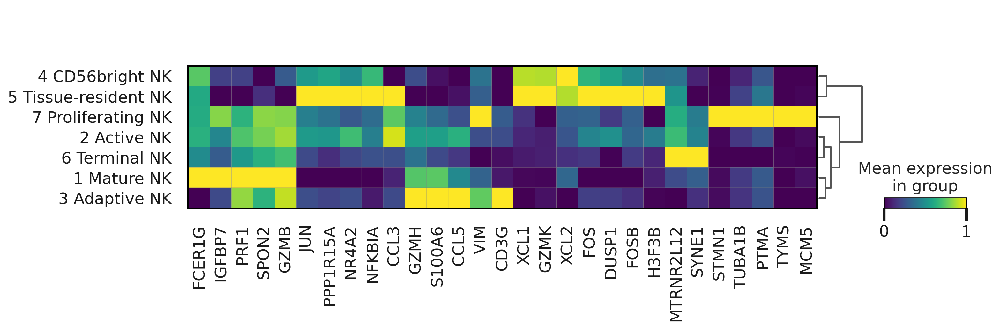

In [39]:
sc.pl.matrixplot(adata_latent, var_names=marker_genes, groupby='leiden_0.4', standard_scale='var', dendrogram =True, var_group_labels='leiden_0.4')

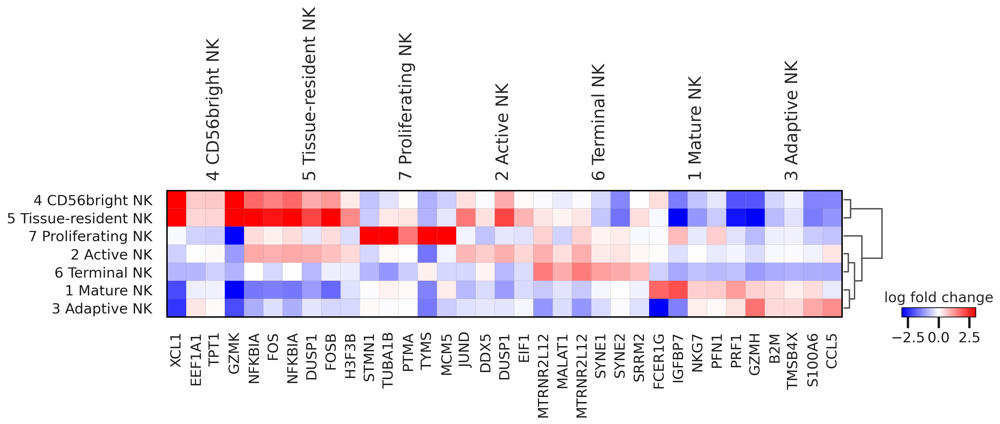

In [40]:
sc.pl.rank_genes_groups_matrixplot(adata_latent, n_genes=5, use_raw=False, values_to_plot="logfoldchanges", colorbar_title='log fold change', vmin=-3, vmax=3, cmap='bwr')


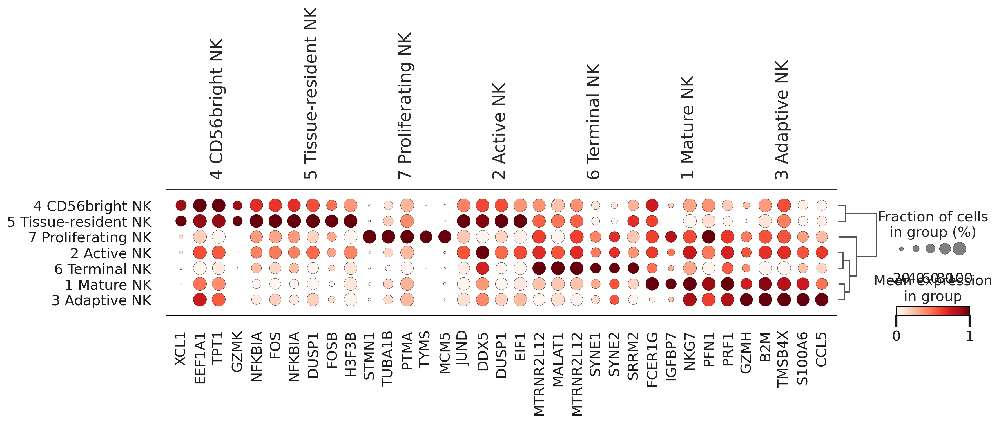

In [41]:
sc.pl.rank_genes_groups_dotplot(adata_latent, n_genes=5, standard_scale='var')


### Cell cycle scoring

In [42]:
#list of genes

cell_cycle_genes = [x.strip() for x in open('regev_lab_cell_cycle_genes.txt')]

#defining two lists, s-phase genes and g2m genes

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_nk.var_names]

#calculating scores

sc.tl.score_genes_cell_cycle(adata_latent, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    386 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    429 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


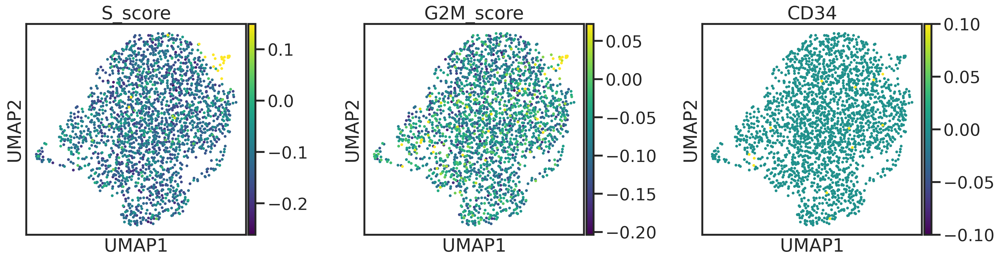

In [43]:
sns.set(style='white', font_scale=1, context='poster', rc={'figure.figsize':(5,5)})

sc.pl.umap(adata_latent, wspace =0.4, color = ['S_score', 'G2M_score', 'CD34'], vmax="p99", color_map = 'viridis', ncols = 3)

- Based on cell cycle scores, cluster 5 represents proliferating NK cells

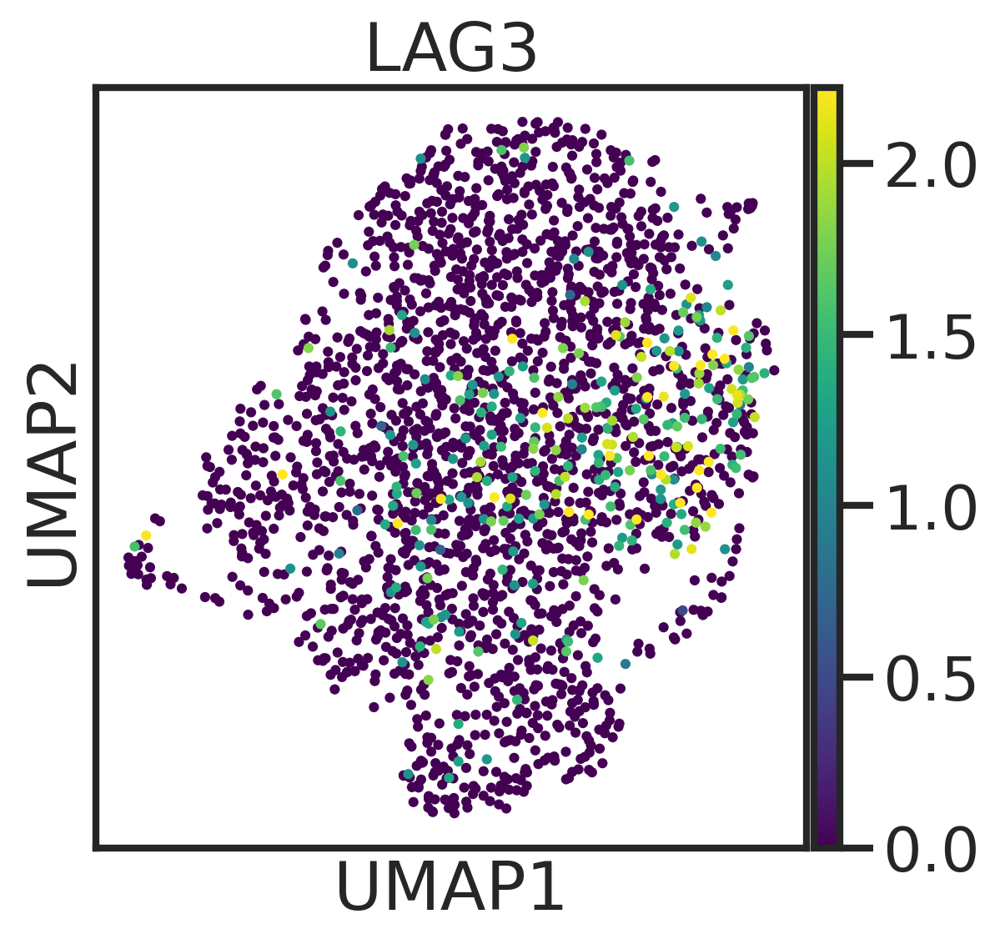

In [44]:
sc.pl.umap(adata_latent, wspace =0.3, color = ['LAG3'], vmax="p99", color_map = 'viridis', ncols = 3)

In [45]:
adata_latent

AnnData object with n_obs × n_vars = 2253 × 32619
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1', 'leiden_0.5', 'leiden_1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'CD56bright_score_yang', 'active_score_yang', 'terminal_score_yang', 'mature_score_yang', 'adaptive_score_yang', 'inflamed_score_yang', 'proliferative_score_melsen', 'precursor_score_melsen', 'ilc_score_melsen', 'tissue_resident_score_melsen', 'CD56bright_score_melsen', 'mature/gzmk-_score_melsen', 'mature/gzmk+_score_melsen', 'cd56dim_reduced_effector_melsen', 'S_score', 'G2M_score', 'phase'
    var:

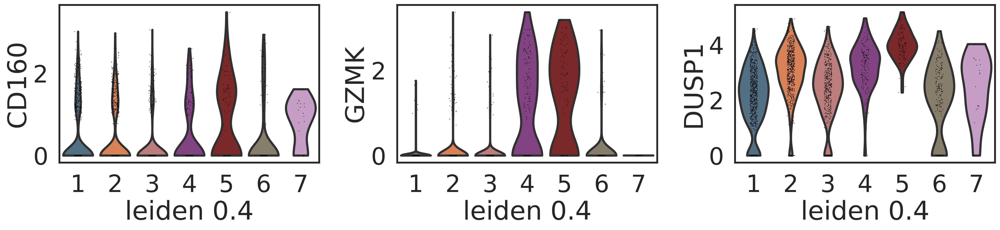

In [67]:
#tissue-resodent markers to distinguish tissue-resident subset from CD56bright. 

sns.set(style='white', font_scale = 1.5, context='poster', rc={'figure.figsize':(6,4)})


sc.pl.violin(adata_latent, ['CD160', 'GZMK', 'DUSP1'],groupby='leiden_0.4')


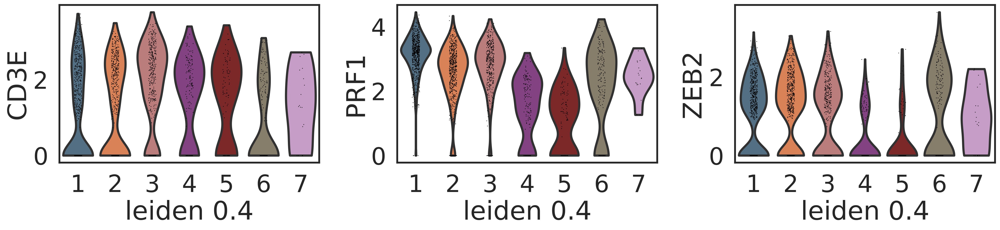

In [68]:
sc.pl.violin(adata_latent, ['CD3E', 'PRF1', 'ZEB2'],groupby='leiden_0.4')

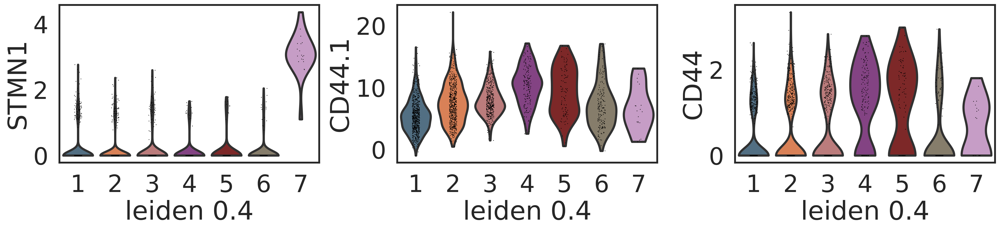

In [69]:
sc.pl.violin(adata_latent, ['STMN1','CD44.1', 'CD44'],groupby='leiden_0.4')

### Proportions of different subsets in each sample

In [49]:
df = adata_latent[adata_latent.obs['DIAGNOSIS'] == "AML"]

In [50]:
df.obs['SAMPLE_CODE'].unique().tolist()

['EG37',
 'EG44',
 'EG45',
 'EG48',
 'EG49',
 'EG50',
 'EG51',
 'EG52',
 'EG53',
 'EG59',
 'EG61',
 'EG62',
 'EG63']

In [51]:
AA_samples = ["EG34", "EG35", "EG36"]
MDS_samples = ['EG46', 'EG47', 'EG54', 'EG55', 'EG56', 'EG57', 'EG58']
MDS_AML_samples = ["EG46", "EG47", "EG48", "EG49"]
AML_samples = ['EG37','EG44', 'EG45','EG48','EG49','EG50','EG51','EG52','EG53','EG59','EG61','EG62','EG63']

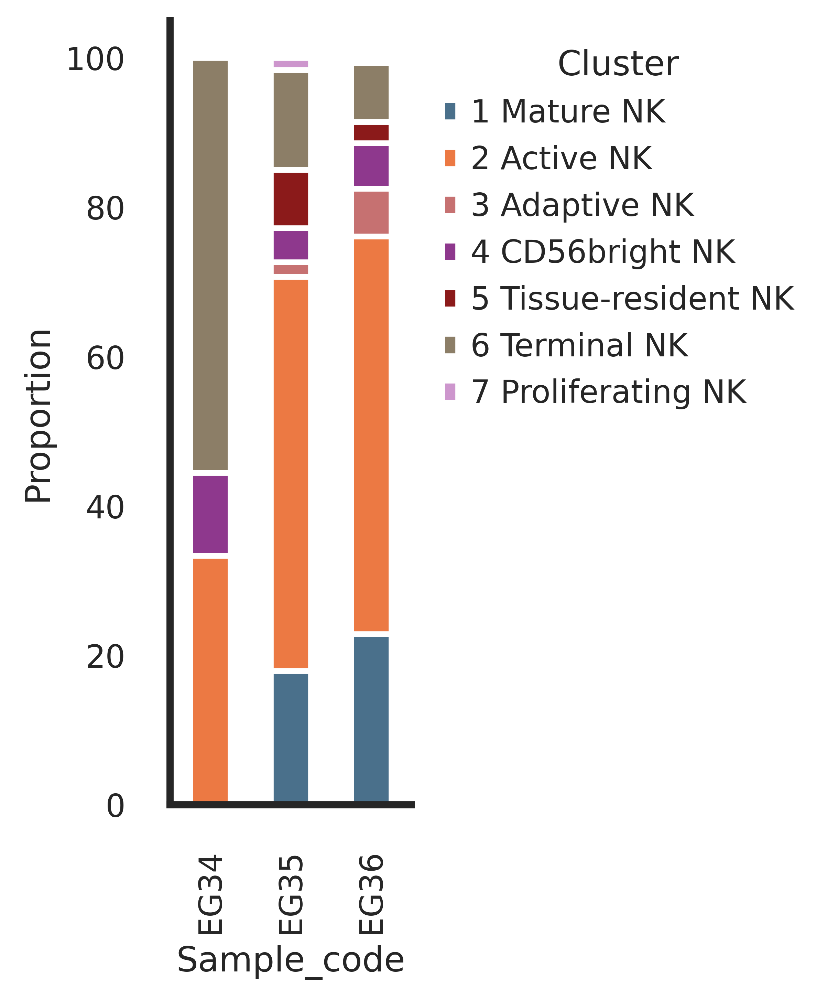

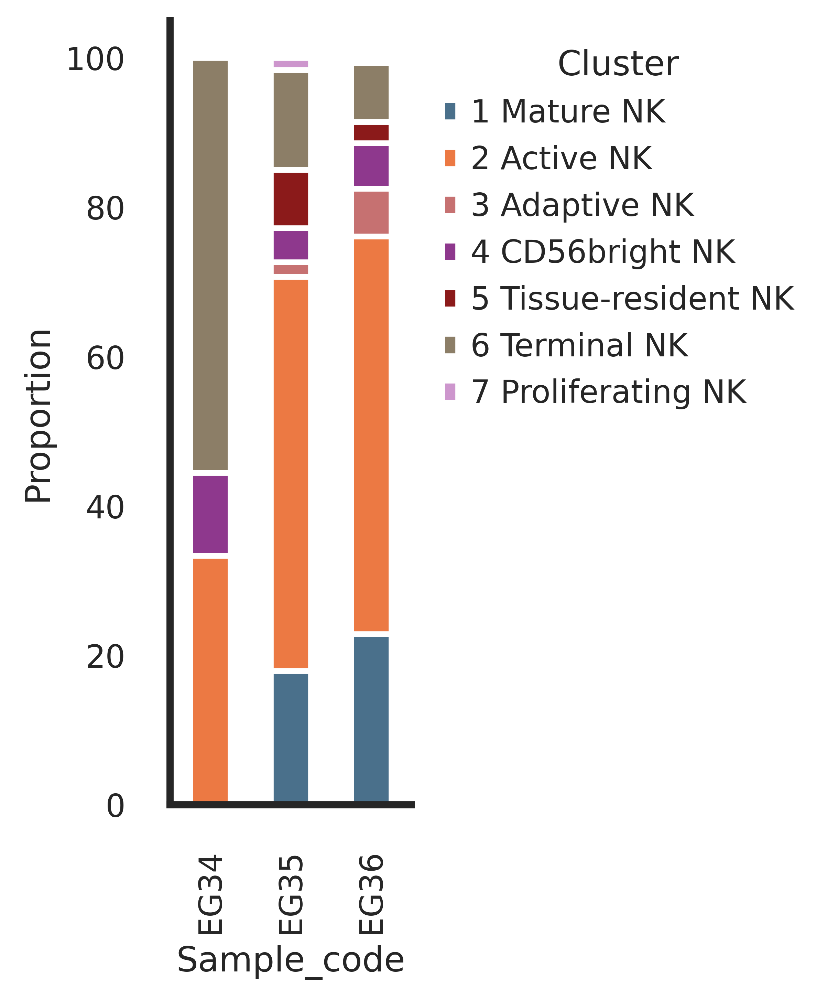

In [52]:
sns.set(style='white', font_scale = 0.5, context='poster', rc={'figure.figsize':(1.5,5)})


cluster_props = get_cluster_proportions(adata_latent,
                            cluster_key="leiden_0.4",
                            sample_key="SAMPLE_CODE",
                            drop_values=AML_samples + MDS_samples)

plot_cluster_proportions(cluster_props, 
                             cluster_palette=cols,
                             xlabel_rotation=90)


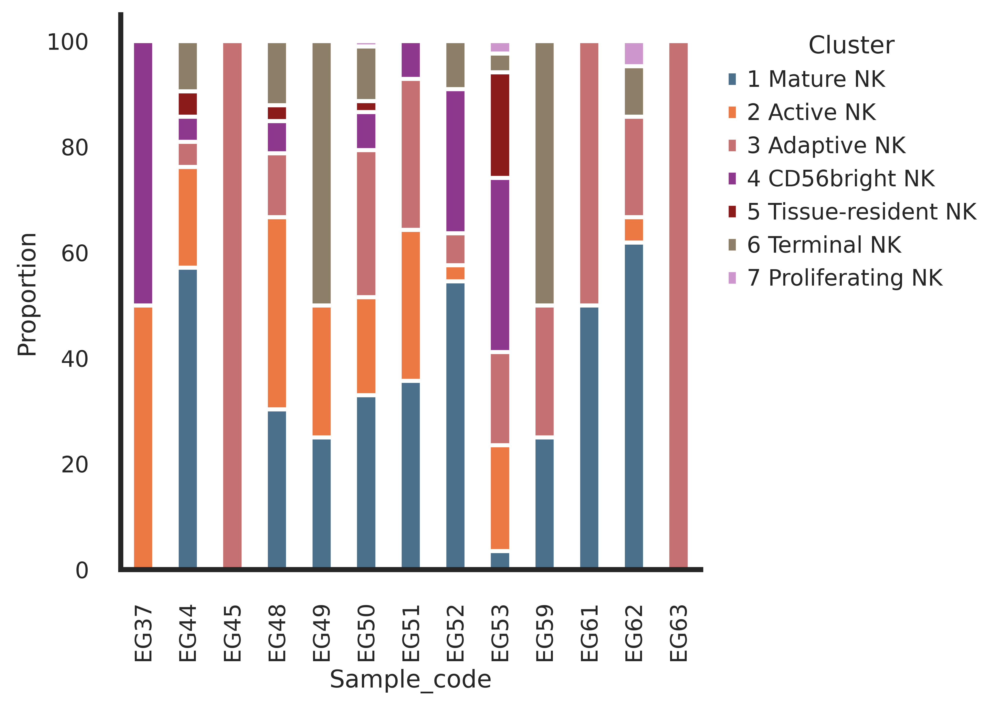

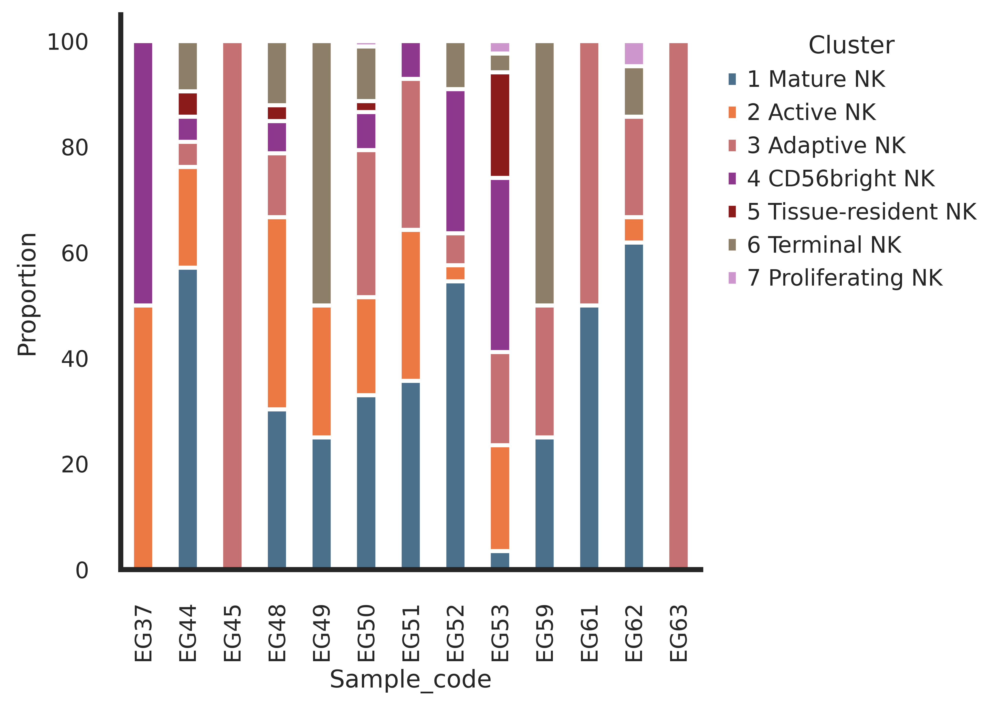

In [53]:
#AML cases

sns.set(style='white', font_scale = 0.5, context='poster', rc={'figure.figsize':(7,5)})


cluster_props = get_cluster_proportions(adata_latent,
                            cluster_key="leiden_0.4",
                            sample_key="SAMPLE_CODE",
                            drop_values=AA_samples + MDS_samples)

plot_cluster_proportions(cluster_props, 
                             cluster_palette=cols,
                             xlabel_rotation=90)

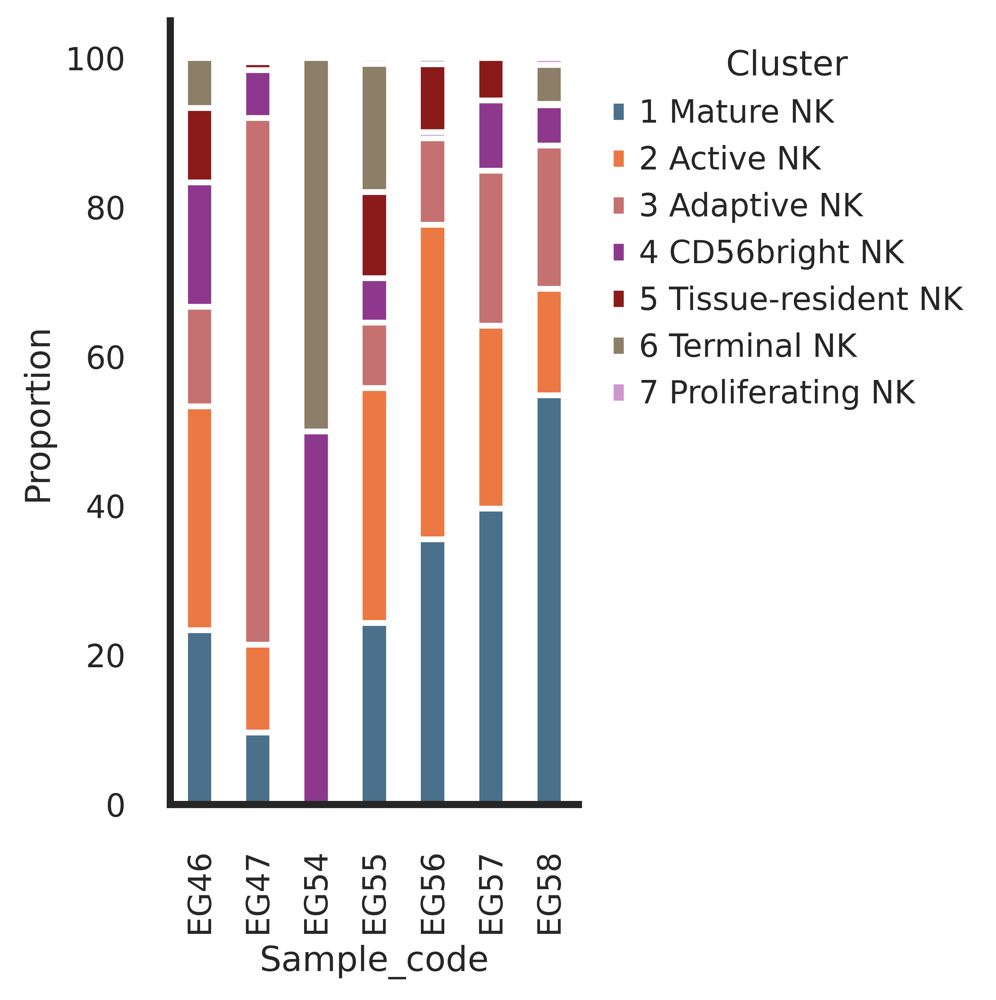

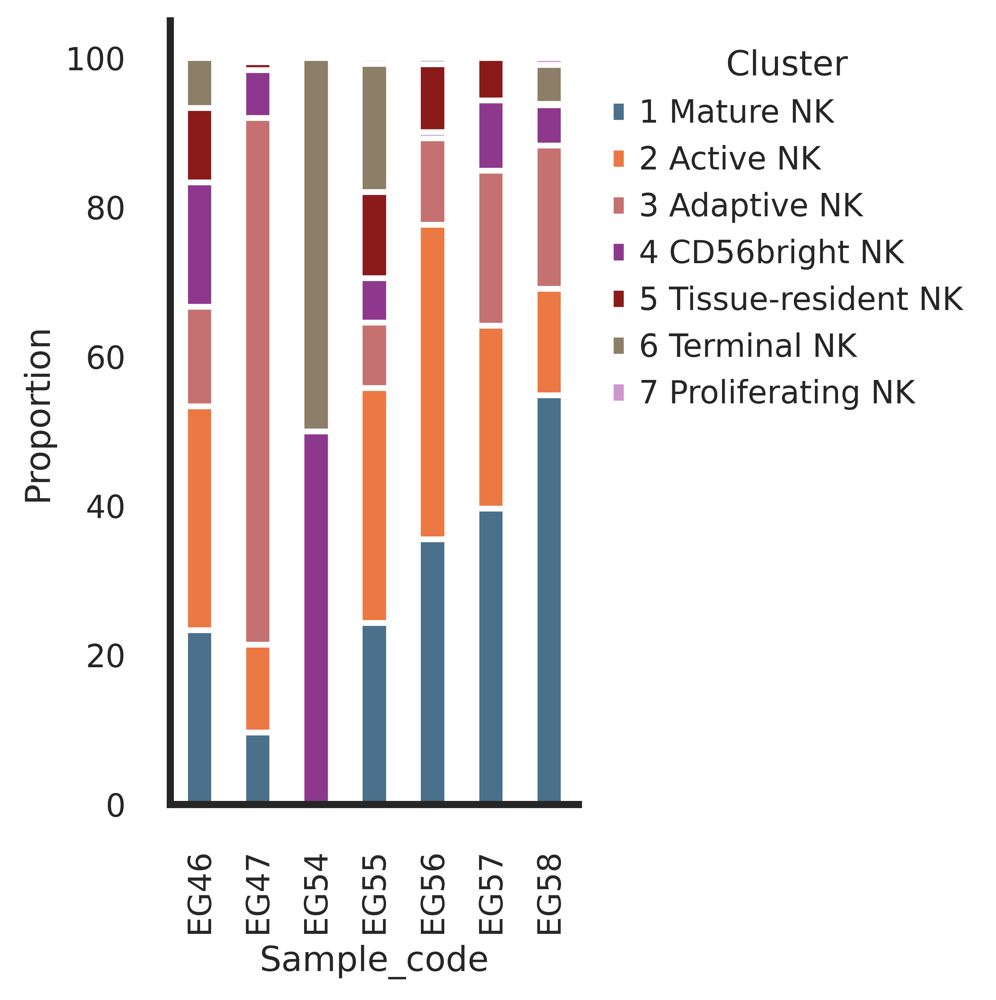

In [54]:
#MDS cases
sns.set(style='white', font_scale = 0.5, context='poster', rc={'figure.figsize':(5,5)})


cluster_props = get_cluster_proportions(adata_latent,
                            cluster_key="leiden_0.4",
                            sample_key="SAMPLE_CODE",
                            drop_values=AA_samples + AML_samples)

plot_cluster_proportions(cluster_props, 
                             cluster_palette=cols,
                             xlabel_rotation=90)

In [55]:
other = ['EG54', 'EG55', 'EG56', 'EG57', 'EG58','EG37','EG44', 'EG45','EG50','EG51','EG52','EG53','EG59','EG61','EG62','EG63']

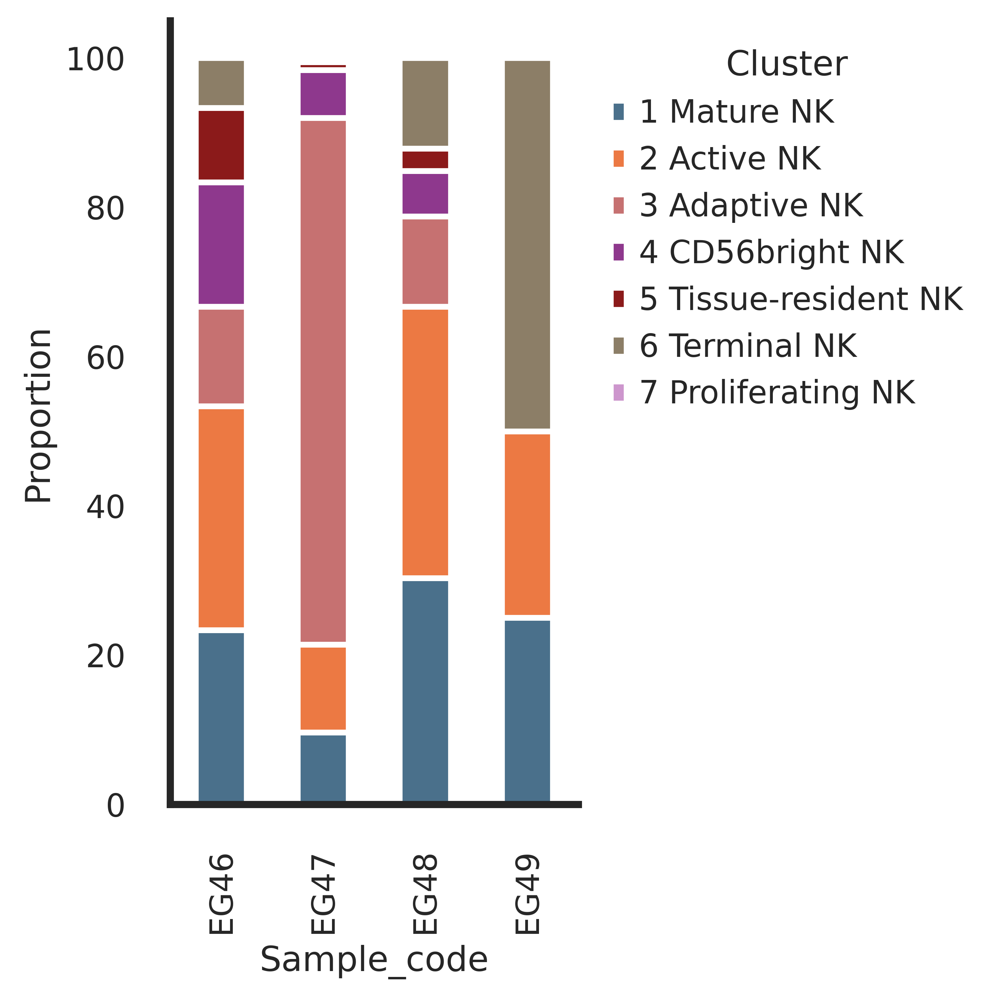

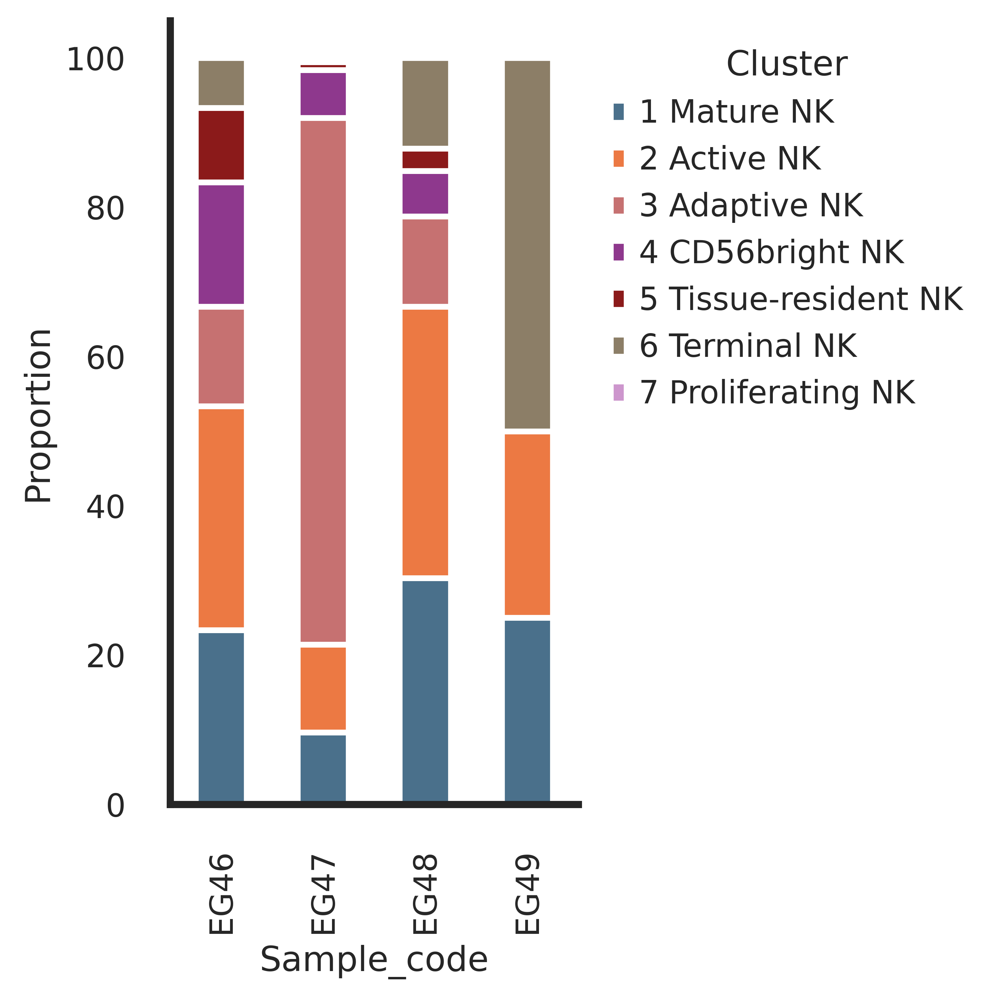

In [56]:
#MDS-AML cases

cluster_props = get_cluster_proportions(adata_latent,
                            cluster_key="leiden_0.4",
                            sample_key="SAMPLE_CODE",
                            drop_values=AA_samples + other)

plot_cluster_proportions(cluster_props, 
                             cluster_palette=cols,
                             xlabel_rotation=90)